Notebook for training of YOLOv5 model
Written by Lim Rui An Ryan U2022692K

# Installation of Required Dependencies

In [ ]:
import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.10.0+cu111 (Tesla T4)


In [ ]:
%cd /content/
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

Cloning into 'yolov5'...
remote: Enumerating objects: 11142, done.
remote: Total 11142 (delta 0), reused 0 (delta 0), pack-reused 11142
Receiving objects: 100% (11142/11142), 11.14 MiB | 7.67 MiB/s, done.
Resolving deltas: 100% (7703/7703), done.
/content/yolov5/yolov5


# Set-up YOLOv5 & View GPU Specifications

In [ ]:
%cd /content/yolov5 # Change working directory for imports

from yolov5 import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v6.1-11-g63ddb6f torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 42.2/78.2 GB disk)


# Testing YOLOv5

detect: weights=['yolov5s.pt'], source=data/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-11-g63ddb6f torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

100% 14.1M/14.1M [00:00<00:00, 181MB/s]

Fusing layers... 
Model Summary: 213 layers, 7225885 parameters, 0 gradients, 16.5 GFLOPs
image 1/2 /content/yolov5/yolov5/data/images/bus.jpg: 640x480 4 persons, 1 bus, Done. (0.017s)
image 2/2 /content/yolov5/yolov5/data/images/zidane.jpg: 384x640 2 persons, 2 ties, Done. (0.018s)
Speed: 0.5ms pre-process, 17.7ms inference, 3.2ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


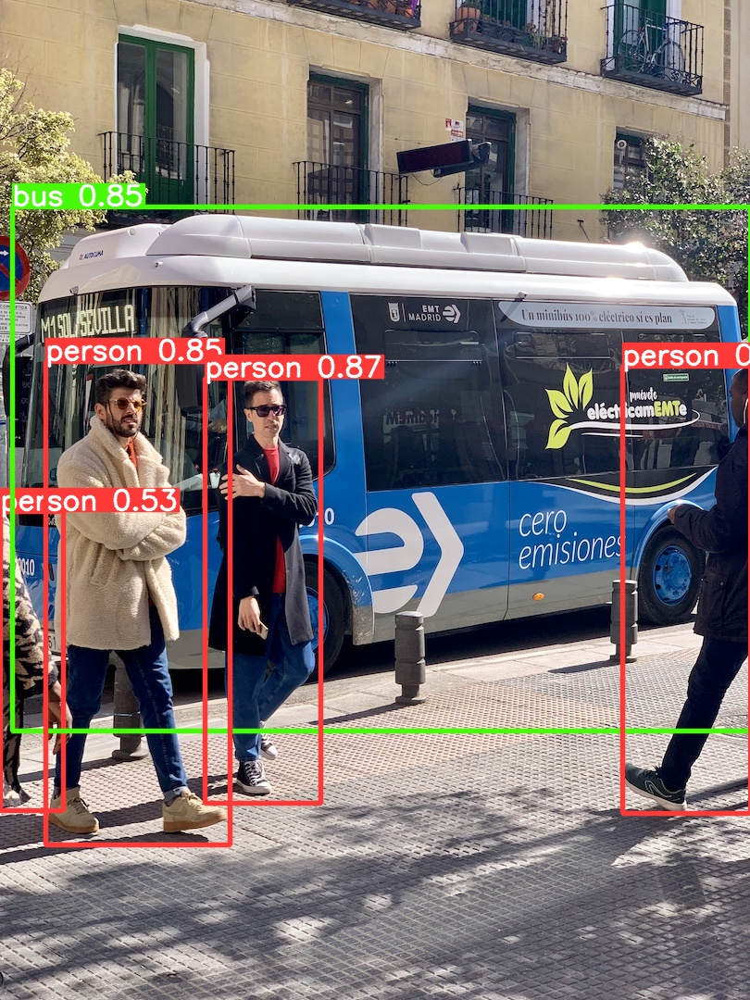

In [ ]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images
display.Image(filename='runs/detect/exp/bus.jpg', width=600)

# Get Augmented Dataset from Roboflow

In [ ]:
#%cd /content
#!curl -L "https://app.roboflow.com/ds/LUC7uqhXY7?key=zuOLXg0hBd" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

# get the dataset
from roboflow import Roboflow
rf = Roboflow(api_key="IPCdyVXAT7GSfBLj7Xr5")
project = rf.workspace("mdpmaster-ipdzy").project("testset-zj24s")
dataset = project.version(2).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/TestSet-2 in yolov5pytorch:: 100%|██████████| 7142/7142 [00:05<00:00, 1240.42it/s]


#Training of Model on Dataset
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [ ]:
!python train.py --img 416 --batch 16 --epochs 30 --data {dataset.location}/data.yaml --weights yolov5m.pt --cache
#!python train.py --img 416 --batch 16 --epochs 200 --data {dataset.location}/data.yaml --weights yolov5m.pt --cache

train: weights=yolov5m.pt, cfg=, data=/content/datasets/TestSet-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-11-g63ddb6f torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, 

# Evaluating Performance w/ Data Visualization

In [ ]:
from utils.plots import plot_results 
plot_results("/content/yolov5/runs/train/exp/results.csv")
#plot_results("/content/yolov5/runs/train/exp/results.csv")  # plot 'results.csv' as 'results.png'
from IPython.display import Image
#Image('/content/yolov5/runs/train/exp/results.png')

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

Test Set Data:


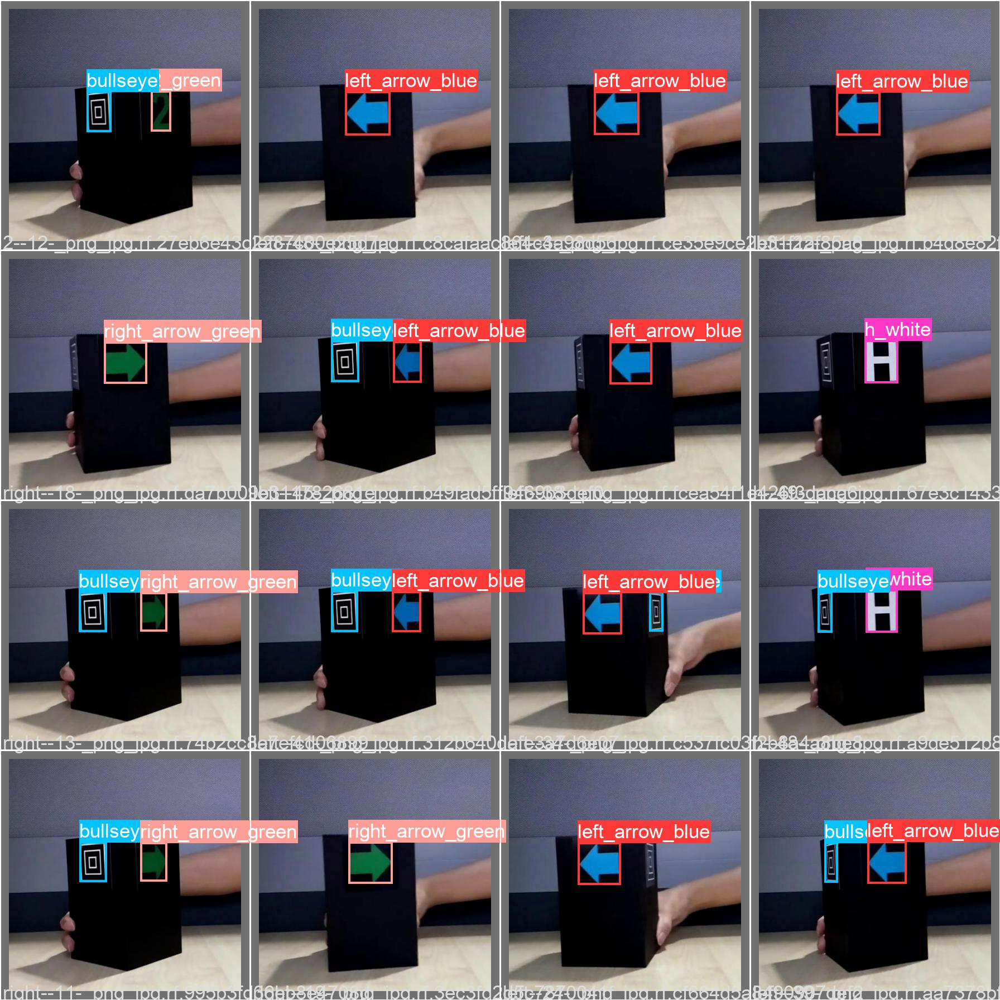

In [ ]:
print("Test Set Data:")
Image(filename='/content/yolov5/runs/train/exp/val_batch0_labels.jpg', width=900)

Test Set Predictions:


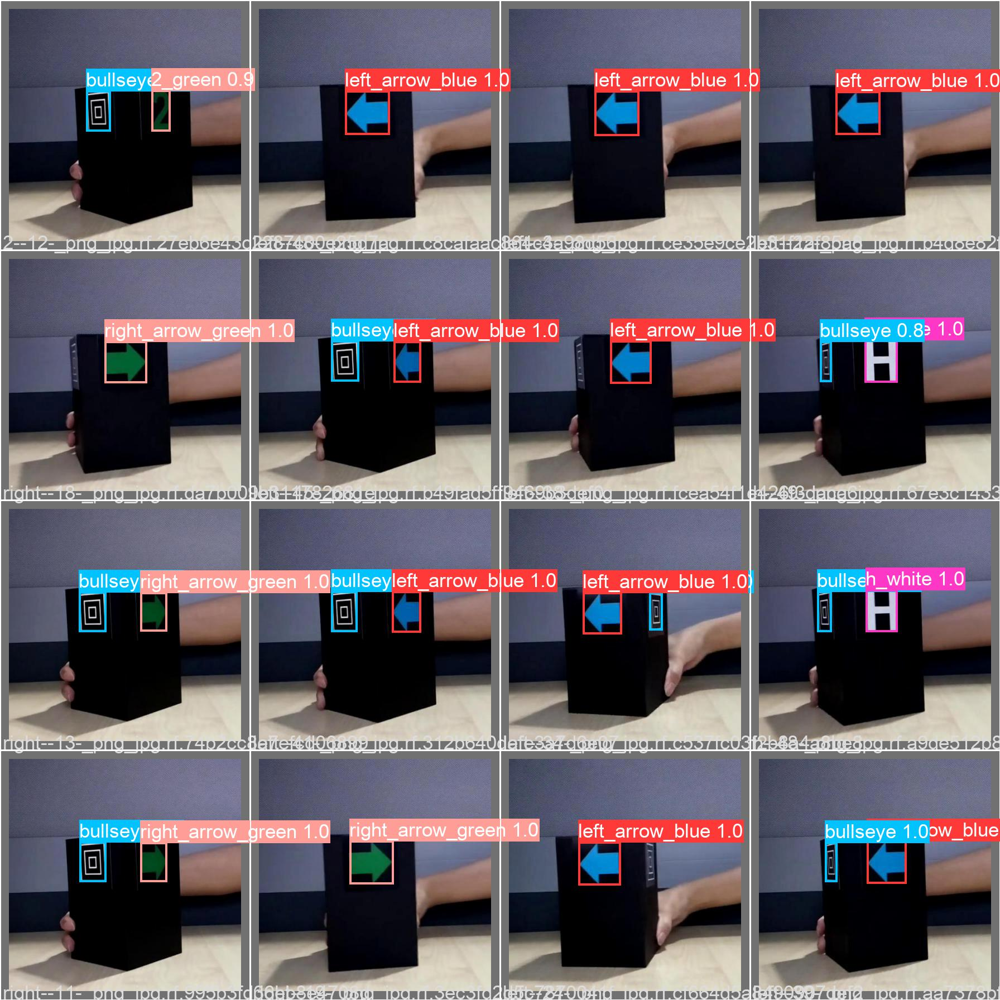

In [ ]:
print("Test Set Predictions:")
Image(filename='/content/yolov5/runs/train/exp/val_batch0_pred.jpg', width=900)

# Testing Computed Weights

* weights=ROOT / 'yolov5s.pt',  # model.pt path(s)
* source=ROOT / 'data/images',  # file/dir/URL/glob, 0 for webcam
* data=ROOT / 'data/coco128.yaml',  # dataset.yaml path
* imgsz=(640, 640),  # inference size (height, width)
* conf_thres=0.25,  # confidence threshold
* iou_thres=0.45,  # NMS IOU threshold
* max_det=1000,  # maximum detections per image
* device='',  # cuda device, i.e. 0 or 0,1,2,3 or cpu
* view_img=False,  # show results
* save_txt=False,  # save results to *.txt
* save_conf=False,  # save confidences in --save-txt labels
* save_crop=False,  # save cropped prediction boxes
* nosave=False,  # do not save images/videos
* classes=None,  # filter by class: --class 0, or --class 0 2 3
* agnostic_nms=False,  # class-agnostic NMS
* augment=False,  # augmented inference
* visualize=False,  # visualize features
* update=False,  # update all models
* project=ROOT / 'runs/detect',  # save results to project/name
* name='exp',  # save results to project/name
* exist_ok=False,  # existing project/name ok, do not increment
* line_thickness=3,  # bounding box thickness (pixels)
* hide_labels=False,  # hide labels
* hide_conf=False,  # hide confidences
* half=False,  # use FP16 half-precision inference
* dnn=False,  # use OpenCV DNN for ONNX inference

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.5 --source /content/drive/MyDrive/OpenCV/ZY_Test_DS

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/drive/MyDrive/OpenCV/ZY_Test_DS, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-11-g63ddb6f torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 290 layers, 20974164 parameters, 0 gradients, 48.3 GFLOPs
image 1/35 /content/drive/MyDrive/OpenCV/ZY_Test_DS/1021.jpg: 320x416 1 g_green, Done. (0.040s)
image 2/35 /content/drive/MyDrive/OpenCV/ZY_Test_DS/1033.jpg: 320x416 1 f_red, 1 g_green, Done. (0.037s)
image 3/35 /content/drive/MyDrive/OpenCV/ZY_Test_DS/11.jpg: 320x416 1 bullseye, Done. (0.037s)
image 4/35 /content/drive/MyDrive/OpenCV/ZY_Test_DS/1_30.j

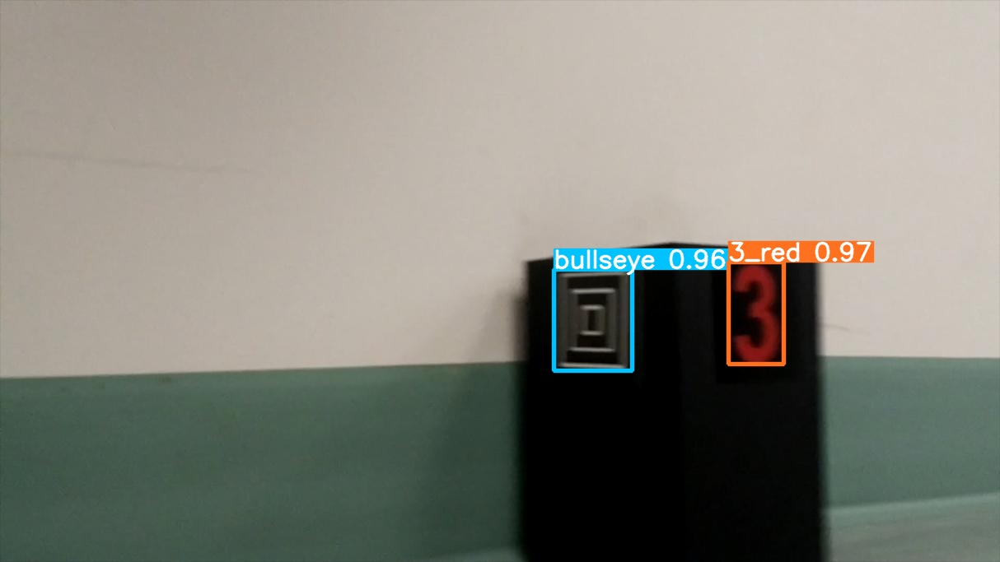

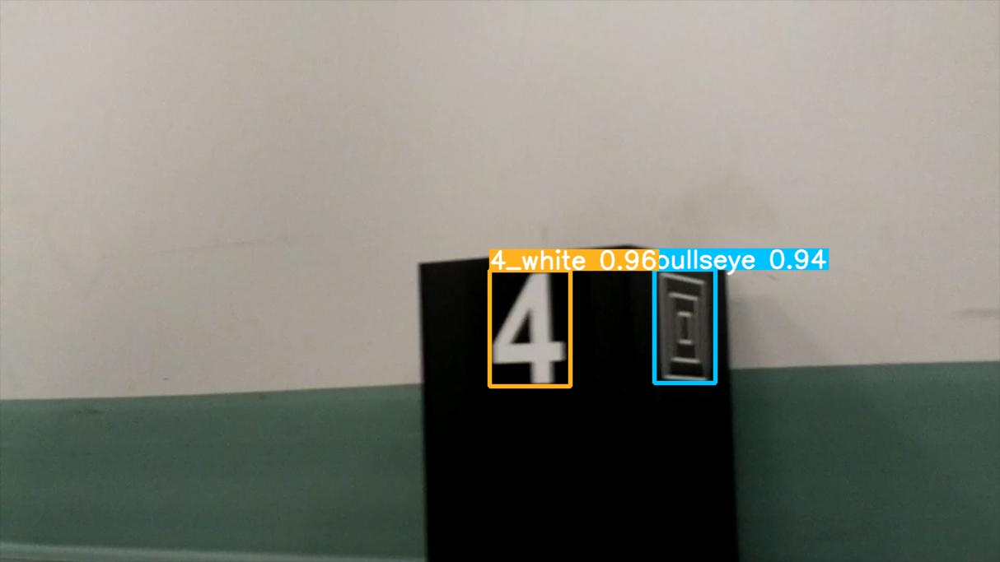

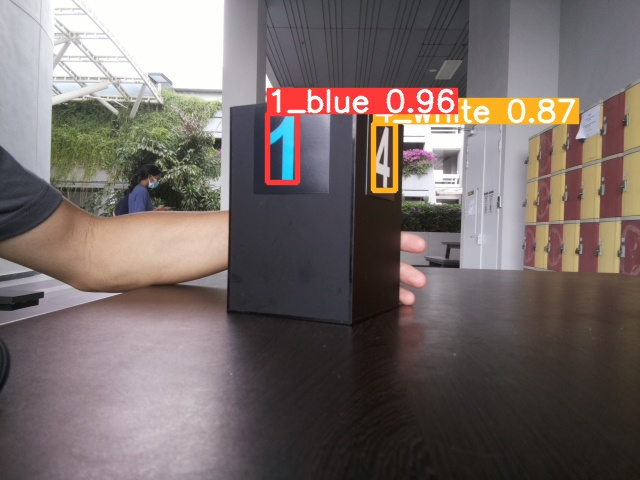

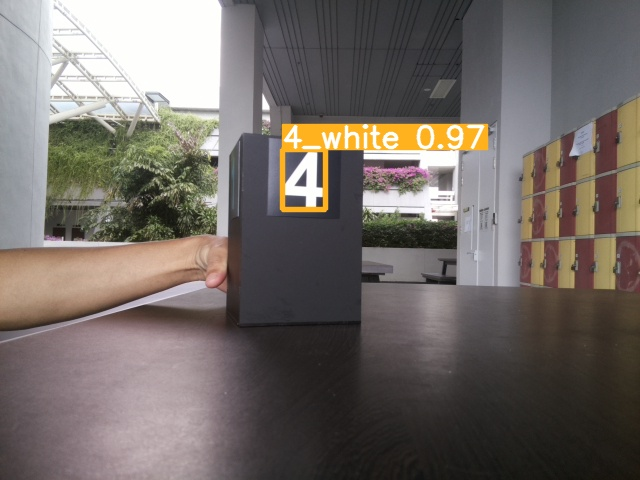

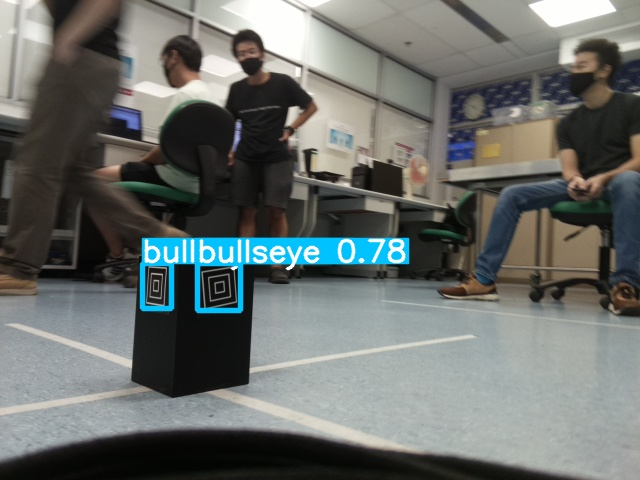

...

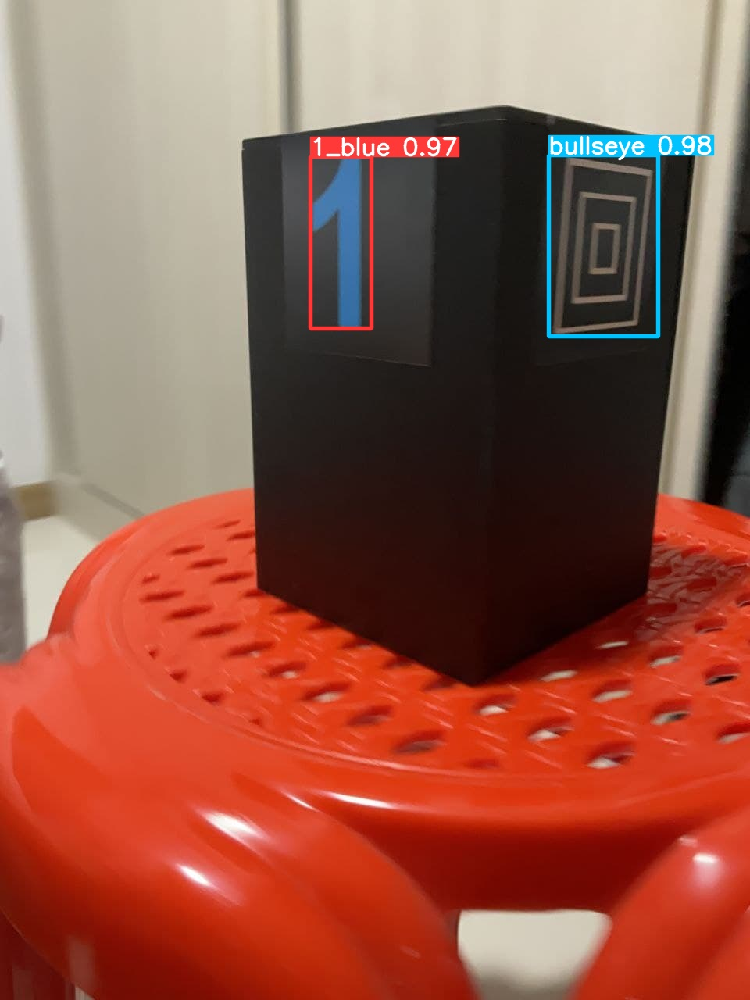

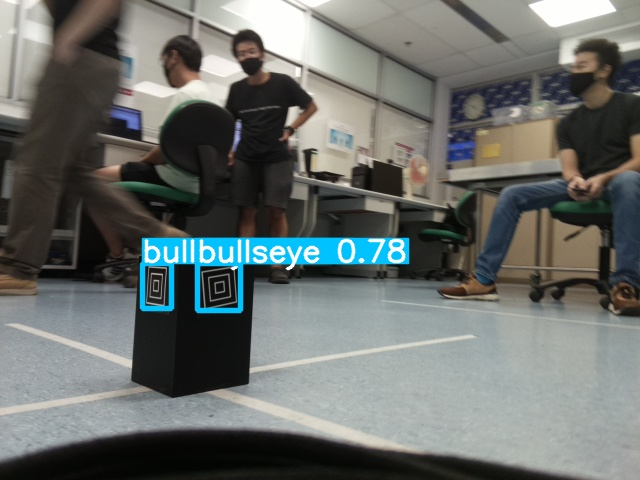

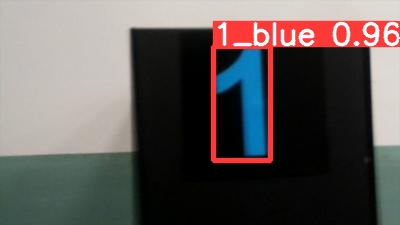

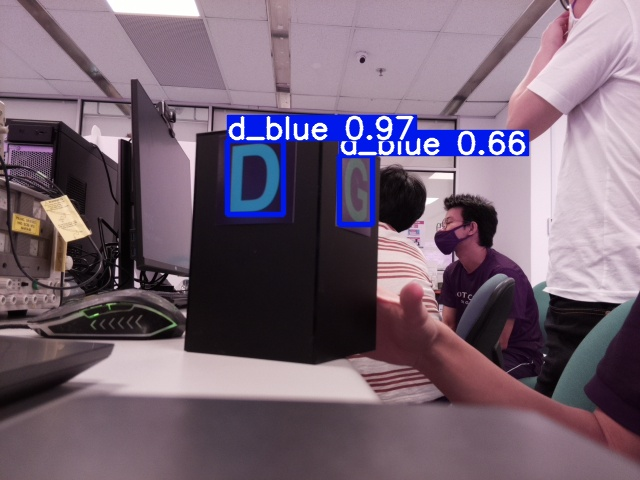

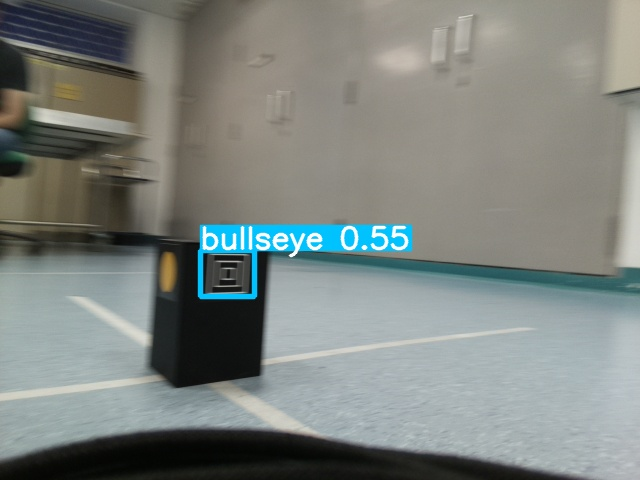

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

Test Recorded Weights

In [ ]:
#!python detect.py --weights /content/e30b16croppedbest.pt --img 416 --conf 0.5 --source /content/drive/MyDrive/OpenCV/MDPTestImages/ 
!python detect.py --weights /content/e30b16croppedbest.pt --img 416 --conf 0.5 --source /content/drive/MyDrive/OpenCV/ZY_Test_DS

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp4/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")